In [1]:
import os
import torch
import mmcv
from mmdet.apis import inference_detector, show_result_pyplot

/Users/da.korolev/opt/anaconda3/lib/python3.9/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/Users/da.korolev/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
from mmcv import Config

cfg = Config.fromfile('mmdetection/configs/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_1x_coco.py')

In [3]:
cfg.dataset_type = "COCODataset"
cfg.data.test.ann_file = "coco_test.json"
cfg.data.test.classes = ("road-sign",)
cfg.data.train.classes = ("road-sign",)
cfg.data.val.classes = ("road-sign",)

cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

In [4]:
model = torch.load("models/road-signs-segmentor.pth", map_location="cpu")
model.cfg = cfg

/Users/da.korolev/Documents/university/master-courses/cv-and-gans/labs/03-segmentation/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


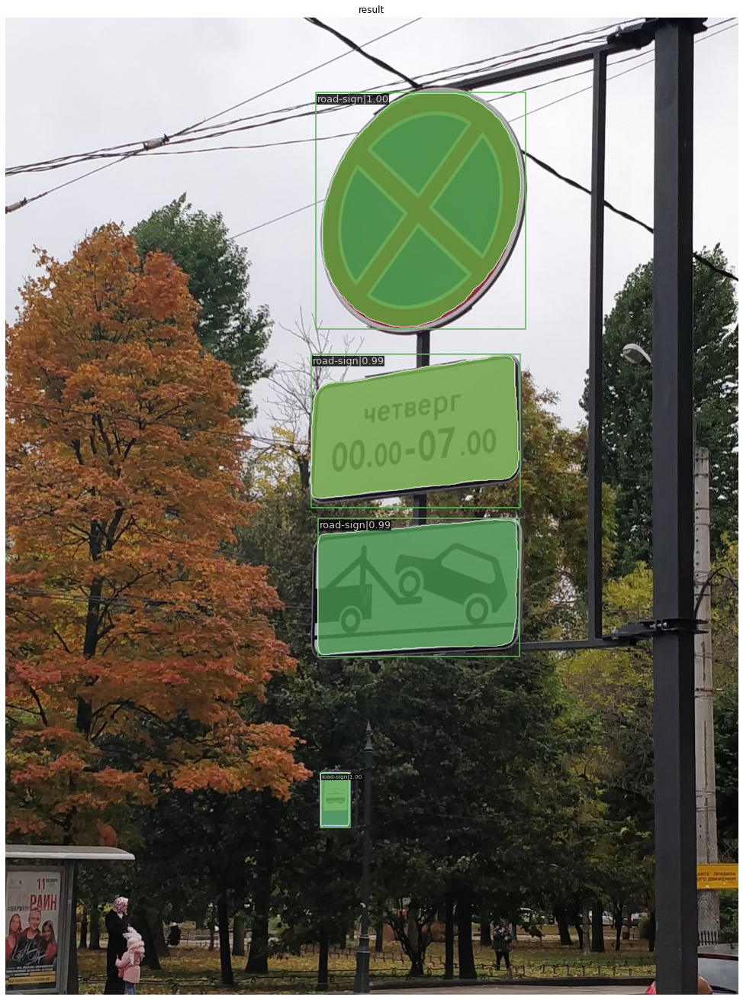

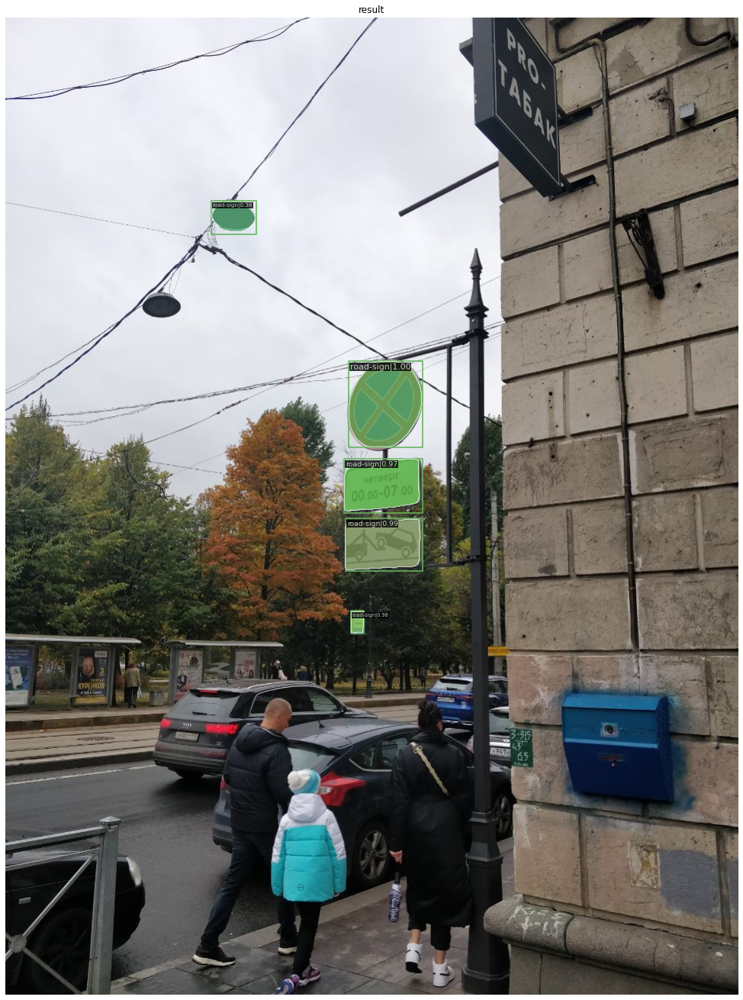

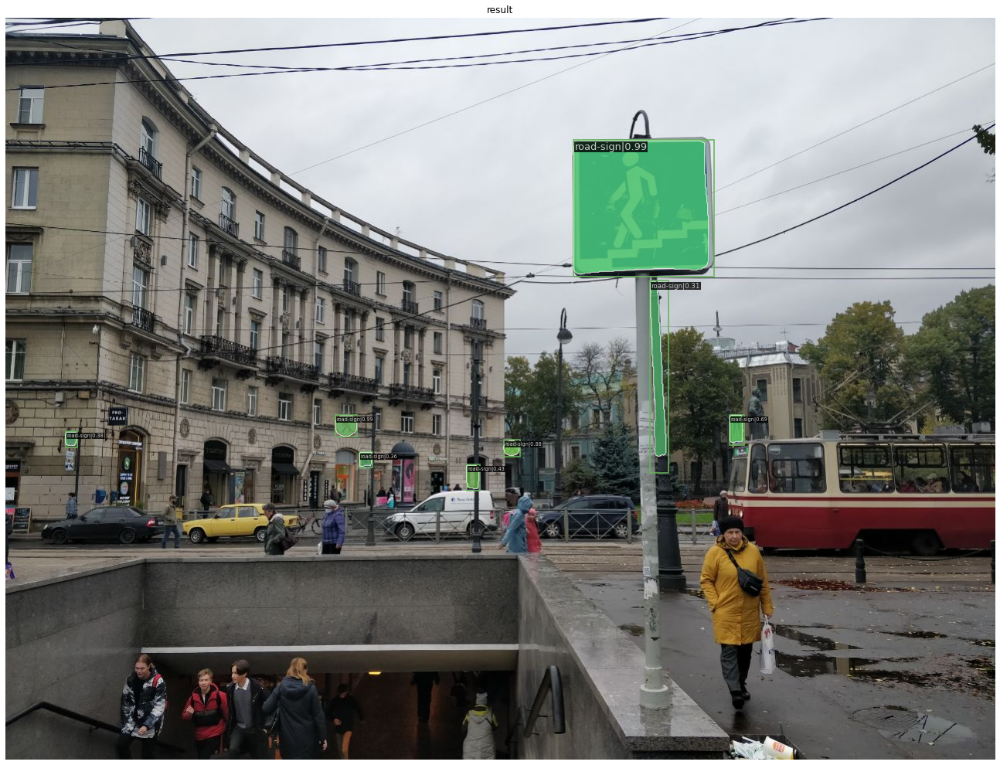

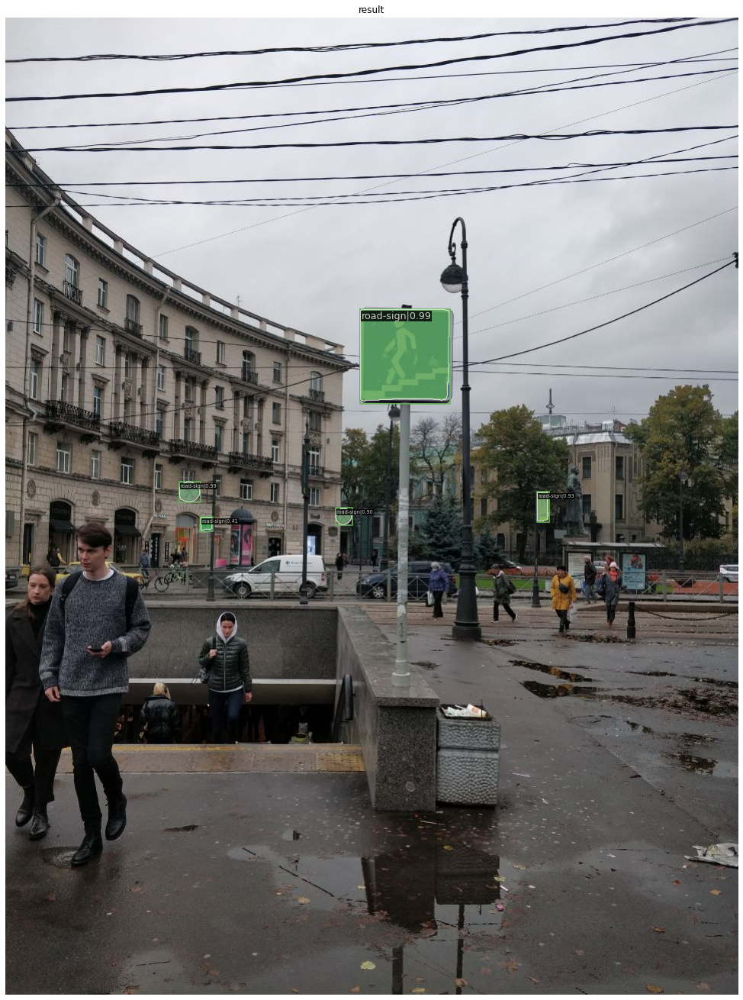

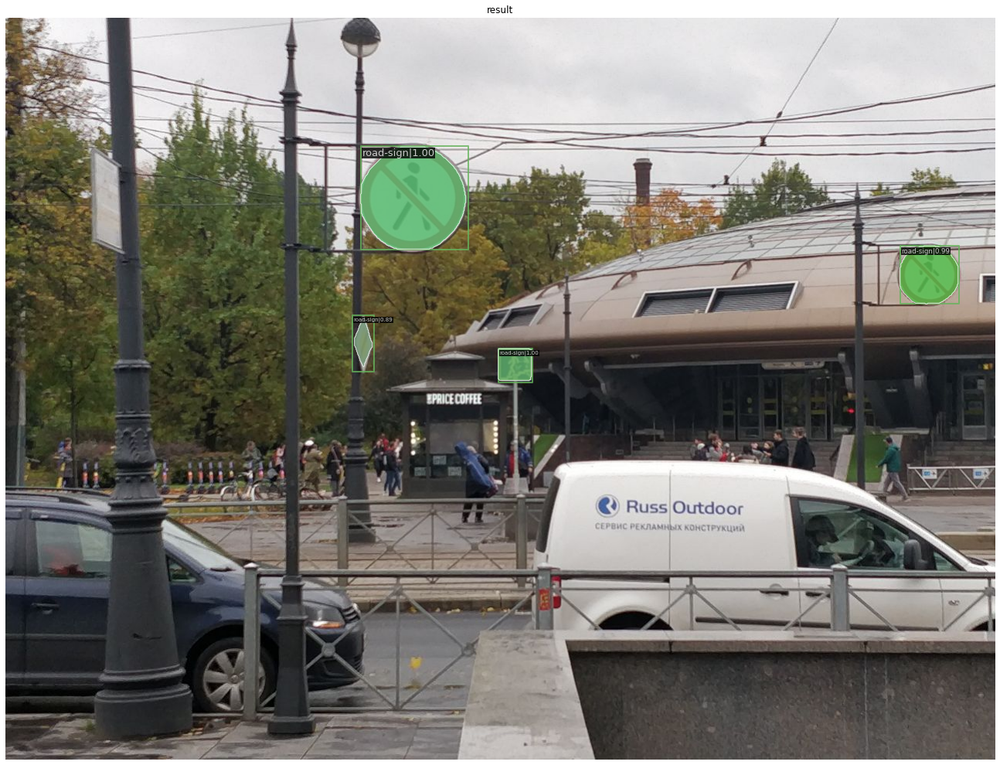

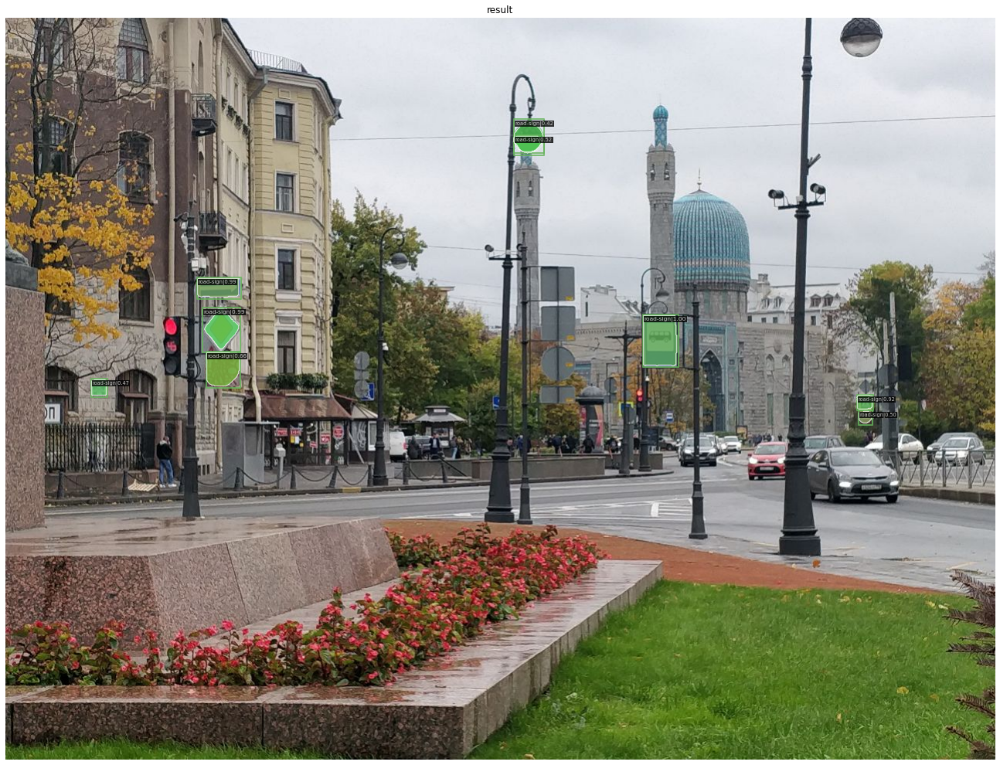

In [5]:
images_folder = "data"

for file in os.listdir(images_folder):
    img = mmcv.imread(os.path.join(images_folder, file))
    result = inference_detector(model, img)
    show_result_pyplot(model, img, result)